In [30]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [31]:
 !ls /content/drive/MyDrive/ISBI-2012-challenge

challenge-error-metrics.bsh  test-labels.tif  test-volume.tif  train-labels.tif  train-volume.tif


In [32]:
!mkdir -p /content/data
!cp /content/drive/MyDrive/ISBI-2012-challenge/* /content/data/

In [33]:
import tifffile as tiff
import numpy as np

train_volume_path = "/content/data/train-volume.tif"
train_labels_path = "/content/data/train-labels.tif"
test_volume_path = "/content/data/test-volume.tif"
test_labels_path = "/content/data/test-labels.tif"

train_volume = tiff.imread(train_volume_path)
train_labels = tiff.imread(train_labels_path)
test_volume = tiff.imread(test_volume_path)
test_labels = tiff.imread(test_labels_path)

print(f"Train volume shape: {train_volume.shape}")
print(f"Train labels shape: {train_labels.shape}")
print(f"Test volume shape: {test_volume.shape}")
print(f"Test labels shape: {test_labels.shape}")


Train volume shape: (30, 512, 512)
Train labels shape: (30, 512, 512)
Test volume shape: (30, 512, 512)
Test labels shape: (30, 512, 512)


In [34]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import scipy.ndimage as ndi
from scipy.ndimage import distance_transform_edt, map_coordinates, gaussian_filter
from albumentations.core.transforms_interface import ImageOnlyTransform

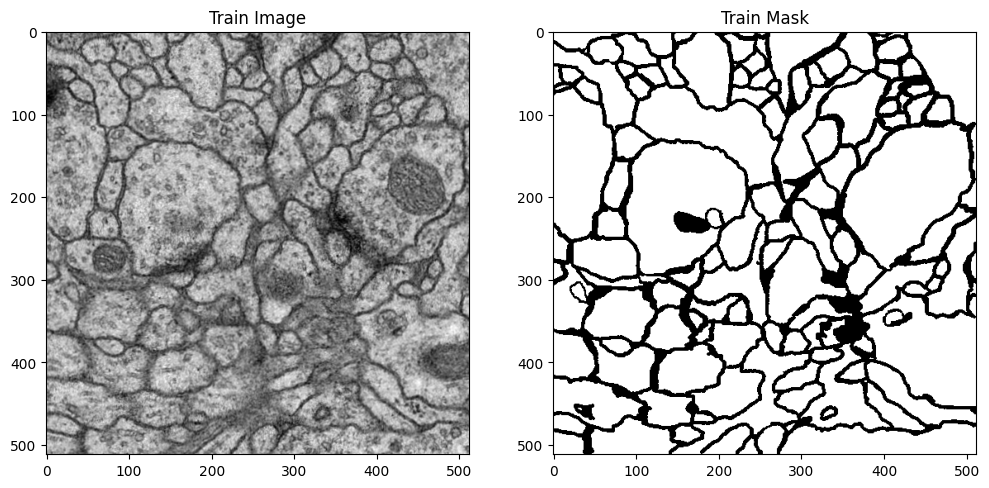

In [35]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Train Image")
plt.imshow(train_volume[0], cmap='gray')
plt.subplot(1, 2, 2)
plt.title("Train Mask")
plt.imshow(train_labels[0], cmap='gray')
plt.show()


In [36]:
train_images, val_images, train_masks, val_masks = train_test_split(
    train_volume, train_labels, test_size=0.2, random_state=42
)

print(f"Train images: {train_images.shape}")
print(f"Validation images: {val_images.shape}")

Train images: (24, 512, 512)
Validation images: (6, 512, 512)


In [37]:
class ElasticDeformation(ImageOnlyTransform):
    def __init__(self, alpha=10, sigma=10, always_apply=False, p=0.5):
        super().__init__(always_apply=always_apply, p=p)
        self.alpha = alpha
        self.sigma = sigma

    def apply(self, image, **params):
        random_state = np.random.RandomState(None)
        shape = image.shape
        dx = gaussian_filter((random_state.rand(*shape) * 2 - 1), self.sigma, mode="constant", cval=0) * self.alpha
        dy = gaussian_filter((random_state.rand(*shape) * 2 - 1), self.sigma, mode="constant", cval=0) * self.alpha

        x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))

        distorted_image = map_coordinates(image, indices, order=3, mode='reflect').reshape(shape)
        return distorted_image


In [38]:
from albumentations import (
    HorizontalFlip, VerticalFlip, RandomRotate90, Normalize, Compose, ShiftScaleRotate, RandomBrightnessContrast
)
from albumentations.pytorch import ToTensorV2

def get_train_transforms():
    return Compose([
        HorizontalFlip(p=0.5),
        VerticalFlip(p=0.5),
        RandomRotate90(p=0.5),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, p=0.5),
        ElasticDeformation(alpha=10, sigma=10, always_apply=False, p=0.3),  # Исправлено
        RandomBrightnessContrast(p=0.2),
        Normalize(mean=(0.5,), std=(0.5,)),
        ToTensorV2()
    ])


In [39]:
class ISBIDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx] / 255.0
        mask = self.masks[idx] // 255

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask.long()


In [40]:
train_dataset = ISBIDataset(train_images, train_masks, transform=get_train_transforms())
val_dataset = ISBIDataset(val_images, val_masks)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

In [41]:
def crop(tensor, target_tensor):
    target_size = target_tensor.shape[-2:]
    tensor_size = tensor.shape[-2:]
    delta_h = (tensor_size[0] - target_size[0]) // 2
    delta_w = (tensor_size[1] - target_size[1]) // 2
    return tensor[..., delta_h:delta_h + target_size[0], delta_w:delta_w + target_size[1]]


In [42]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        self.enc1 = self.contract_block(in_channels, 64)
        self.enc2 = self.contract_block(64, 128)
        self.enc3 = self.contract_block(128, 256)
        self.enc4 = self.contract_block(256, 512)
        self.bottleneck = self.contract_block(512, 1024)

        self.upconv4 = self.expand_block(1024, 512)
        self.conv4 = nn.Conv2d(1024, 512, kernel_size=1)
        self.upconv3 = self.expand_block(512, 256)
        self.conv3 = nn.Conv2d(512, 256, kernel_size=1)
        self.upconv2 = self.expand_block(256, 128)
        self.conv2 = nn.Conv2d(256, 128, kernel_size=1)
        self.upconv1 = self.expand_block(128, 64)
        self.conv1 = nn.Conv2d(128, 64, kernel_size=1)

        # Final output layer
        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):

        # Encoding path
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, kernel_size=2))
        enc3 = self.enc3(F.max_pool2d(enc2, kernel_size=2))
        enc4 = self.enc4(F.max_pool2d(enc3, kernel_size=2))
        bottleneck = self.bottleneck(F.max_pool2d(enc4, kernel_size=2))

        # Decoding path
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((crop(enc4, dec4), dec4), dim=1)
        dec4 = self.conv4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((crop(enc3, dec3), dec3), dim=1)
        dec3 = self.conv3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((crop(enc2, dec2), dec2), dim=1)
        dec2 = self.conv2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((crop(enc1, dec1), dec1), dim=1)
        dec1 = self.conv1(dec1)

        # Final output
        out = self.final(dec1)
        return out

    @staticmethod
    def contract_block(in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels)
        )

    @staticmethod
    def expand_block(in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.ConvTranspose2d(out_channels, out_channels, kernel_size=2, stride=2)
        )



In [43]:
def create_tiles(image, tile_size, overlap):
    tiles = []
    step = tile_size - overlap
    h, w = image.shape
    for y in range(0, h - tile_size + 1, step):
        for x in range(0, w - tile_size + 1, step):
            tile = image[y:y+tile_size, x:x+tile_size]
            tiles.append((tile, (y, x)))
    return tiles


In [44]:
def assemble_image(tiles, image_shape, tile_size, overlap):
    assembled = np.zeros(image_shape, dtype=np.float32)
    counts = np.zeros(image_shape, dtype=np.float32)

    step = tile_size - overlap
    for tile, (y, x) in tiles:
        tile_h, tile_w = tile.shape
        assembled_h = min(tile_h, image_shape[0] - y)
        assembled_w = min(tile_w, image_shape[1] - x)

        assembled[y:y+assembled_h, x:x+assembled_w] += tile[:assembled_h, :assembled_w].astype(assembled.dtype)
        counts[y:y+assembled_h, x:x+assembled_w] += 1

    return (assembled / np.maximum(counts, 1)).astype(np.uint8)


In [45]:
def pad_with_mirroring(image, padding):
    return np.pad(image, pad_width=padding, mode='reflect')


In [46]:
def predict_large_image(model, image, tile_size, overlap, device='cuda'):
    model.eval()
    padded_image = pad_with_mirroring(image, padding=overlap)
    tiles = create_tiles(padded_image, tile_size, overlap)

    pred_tiles = []
    for tile, (y, x) in tiles:
        tile_tensor = torch.tensor(tile, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(tile_tensor)
            pred = torch.argmax(output, dim=1).cpu().numpy().squeeze(0)
        pred_tiles.append((pred, (y, x)))

    return assemble_image(pred_tiles, image.shape, tile_size, overlap)


In [47]:
def compute_weight_map(mask, w0=10, sigma=5):
    boundaries = ndi.binary_dilation(mask) & ~ndi.binary_erosion(mask)

    d1 = distance_transform_edt(~mask)
    d2 = distance_transform_edt(mask)

    border_weight = w0 * np.exp(-((d1 + d2) ** 2) / (2 * sigma ** 2))

    class_weights = np.ones_like(mask, dtype=np.float32)
    class_weights[mask == 1] *= 2

    weight_map = class_weights + border_weight
    return weight_map

In [48]:
class WeightedCrossEntropyLoss(nn.Module):
    def __init__(self):
        super(WeightedCrossEntropyLoss, self).__init__()

    def forward(self, outputs, targets, weights):
        cropped_targets = crop(targets, outputs)
        cropped_weights = crop(weights, outputs)
        cropped_targets = cropped_targets.unsqueeze(1).long()
        cropped_weights = cropped_weights.unsqueeze(1)
        log_probs = F.log_softmax(outputs, dim=1)
        gathered_log_probs = log_probs.gather(1, cropped_targets)
        gathered_log_probs = gathered_log_probs.squeeze(1)
        loss = -cropped_weights.squeeze(1) * gathered_log_probs
        return loss.mean()


In [49]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)
model = UNet(in_channels=1, out_channels=2).to(device)

cuda


In [50]:
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.constant_(m.weight, 1)
        nn.init.constant_(m.bias, 0)

model.apply(init_weights)

UNet(
  (enc1): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
    (4): ReLU()
    (5): BatchNo

In [51]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001, momentum=0.99)
criterion = WeightedCrossEntropyLoss()

num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    train_loss = 0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        images = torch.nan_to_num(images, nan=0.0, posinf=1.0, neginf=0.0)
        images = torch.clamp(images, min=0.0, max=1.0)

        weights = compute_weight_map(masks.cpu().numpy())
        weights = torch.tensor(weights, dtype=torch.float32).to(device)
        weights = torch.clamp(weights, min=0.1, max=10.0)

        outputs = model(images)
        outputs = torch.clamp(outputs, min=-1.0, max=1.0)

        masks = crop(masks, outputs).long()
        loss = criterion(outputs, masks, weights)

        if torch.isnan(loss):
            print("NaN detected in loss. Exiting training loop.")
            break

        optimizer.zero_grad()
        loss.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        train_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {train_loss / len(train_loader)}")




Epoch 1/20, Loss: 1.140144094824791
Epoch 2/20, Loss: 1.0101609403888385
Epoch 3/20, Loss: 0.9262772624691328
Epoch 4/20, Loss: 0.8695194373528162
Epoch 5/20, Loss: 0.8305936679244041
Epoch 6/20, Loss: 0.8050615166624387
Epoch 7/20, Loss: 0.7868800138433775
Epoch 8/20, Loss: 0.7728730837504069
Epoch 9/20, Loss: 0.7637556915481886
Epoch 10/20, Loss: 0.7561899895469347
Epoch 11/20, Loss: 0.7536810239156088
Epoch 12/20, Loss: 0.7493753110369047
Epoch 13/20, Loss: 0.7461843440930048
Epoch 14/20, Loss: 0.7399166325728098
Epoch 15/20, Loss: 0.7386534959077835
Epoch 16/20, Loss: 0.7403615986307462
Epoch 17/20, Loss: 0.7418050765991211
Epoch 18/20, Loss: 0.7356078376372656
Epoch 19/20, Loss: 0.7342828040321668
Epoch 20/20, Loss: 0.736475758254528


In [52]:
from sklearn.metrics import f1_score
from scipy.spatial.distance import cdist
from sklearn.metrics.cluster import adjusted_rand_score
import scipy.ndimage as ndi

tile_size = 256
overlap = 64

def compute_pixel_error(true_mask, pred_mask):
    true_flat = true_mask.flatten()
    pred_flat = pred_mask.flatten()
    f1 = f1_score(true_flat, pred_flat, average='weighted')
    return 1 - f1

def compute_rand_error(true_mask, pred_mask):
    true_flat = true_mask.flatten()
    pred_flat = pred_mask.flatten()
    rand_index = adjusted_rand_score(true_flat, pred_flat)
    return 1 - rand_index

def compute_warping_error(true_mask, pred_mask):
    boundaries_true = ndi.binary_dilation(true_mask) & ~ndi.binary_erosion(true_mask)
    boundaries_pred = ndi.binary_dilation(pred_mask) & ~ndi.binary_erosion(pred_mask)
    distance_to_true = ndi.distance_transform_edt(~boundaries_true)
    distance_to_pred = ndi.distance_transform_edt(~boundaries_pred)
    error_true_to_pred = np.mean(distance_to_pred[boundaries_true])
    error_pred_to_true = np.mean(distance_to_true[boundaries_pred])
    warping_error = (error_true_to_pred + error_pred_to_true) / 2.0
    return warping_error


def test_model_with_metrics(model, test_images, test_masks, tile_size, overlap, device='cuda'):
    pixel_errors = []
    warping_errors = []
    rand_errors = []

    for i in range(len(test_images)):
        true_mask = test_masks[i]
        pred_mask = predict_large_image(model, test_images[i], tile_size, overlap, device=device)

        true_mask = true_mask.astype(np.int32)
        pred_mask = pred_mask.astype(np.int32)

        pixel_error = compute_pixel_error(true_mask, pred_mask)
        warping_error = compute_warping_error(true_mask, pred_mask)
        rand_error = compute_rand_error(true_mask, pred_mask)

        pixel_errors.append(pixel_error)
        warping_errors.append(warping_error)
        rand_errors.append(rand_error)

        print(f"Image {i + 1}: Pixel Error = {pixel_error:.4f}, "
              f"Warping Error = {warping_error:.4f}, "
              f"Rand Error = {rand_error:.4f}")

    print("\n--- Average Metrics ---")
    print(f"Pixel Error: {np.mean(pixel_errors):.4f}")
    print(f"Warping Error: {np.mean(warping_errors):.4f}")
    print(f"Rand Error: {np.mean(rand_errors):.4f}")



In [53]:
test_model_with_metrics(model, test_volume, test_labels, tile_size, overlap, device=device)


Image 1: Pixel Error = 0.8920, Warping Error = 20.9800, Rand Error = 1.0020
Image 2: Pixel Error = 0.8869, Warping Error = 21.5884, Rand Error = 1.0034
Image 3: Pixel Error = 0.8854, Warping Error = 21.8652, Rand Error = 1.0071
Image 4: Pixel Error = 0.8831, Warping Error = 21.4918, Rand Error = 1.0037
Image 5: Pixel Error = 0.8815, Warping Error = 20.2469, Rand Error = 0.9947
Image 6: Pixel Error = 0.8823, Warping Error = 21.2136, Rand Error = 1.0030
Image 7: Pixel Error = 0.8810, Warping Error = 20.3716, Rand Error = 0.9892
Image 8: Pixel Error = 0.8826, Warping Error = 20.2014, Rand Error = 0.9989
Image 9: Pixel Error = 0.8491, Warping Error = 20.8490, Rand Error = 0.9932
Image 10: Pixel Error = 0.8408, Warping Error = 20.1578, Rand Error = 1.0039
Image 11: Pixel Error = 0.7948, Warping Error = 19.8694, Rand Error = 1.0036
Image 12: Pixel Error = 0.8077, Warping Error = 20.4309, Rand Error = 0.9999
Image 13: Pixel Error = 0.8574, Warping Error = 20.1716, Rand Error = 1.0137
Image 14

In [54]:
def visualize_boundaries_and_distances(true_mask, pred_mask):
    boundaries_true = ndi.binary_dilation(true_mask) & ~ndi.binary_erosion(true_mask)
    boundaries_pred = ndi.binary_dilation(pred_mask) & ~ndi.binary_erosion(pred_mask)
    distance_to_true = ndi.distance_transform_edt(~boundaries_true)
    distance_to_pred = ndi.distance_transform_edt(~boundaries_pred)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(true_mask, cmap="gray")
    axes[0].set_title("True Mask")
    axes[1].imshow(pred_mask, cmap="gray")
    axes[1].set_title("Predicted Mask")
    axes[2].imshow(distance_to_true, cmap="viridis")
    axes[2].set_title("Distance to True Boundaries")
    axes[3].imshow(distance_to_pred, cmap="viridis")
    axes[3].set_title("Distance to Predicted Boundaries")
    plt.show()


In [55]:
def analyze_distances(true_mask, pred_mask):
    boundaries_true = ndi.binary_dilation(true_mask) & ~ndi.binary_erosion(true_mask)
    boundaries_pred = ndi.binary_dilation(pred_mask) & ~ndi.binary_erosion(pred_mask)

    distance_to_true = ndi.distance_transform_edt(~boundaries_true)
    distance_to_pred = ndi.distance_transform_edt(~boundaries_pred)

    mean_distance_true_to_pred = np.mean(distance_to_pred[boundaries_true])
    mean_distance_pred_to_true = np.mean(distance_to_true[boundaries_pred])

    print(f"Mean Distance True to Pred: {mean_distance_true_to_pred:.4f}")
    print(f"Mean Distance Pred to True: {mean_distance_pred_to_true:.4f}")

    max_distance_true_to_pred = np.max(distance_to_pred[boundaries_true])
    max_distance_pred_to_true = np.max(distance_to_true[boundaries_pred])

    print(f"Max Distance True to Pred: {max_distance_true_to_pred:.4f}")
    print(f"Max Distance Pred to True: {max_distance_pred_to_true:.4f}")


In [56]:
def compute_warping_error_with_diagnostics(true_mask, pred_mask):
    boundaries_true = ndi.binary_dilation(true_mask) & ~ndi.binary_erosion(true_mask)
    boundaries_pred = ndi.binary_dilation(pred_mask) & ~ndi.binary_erosion(pred_mask)

    distance_to_true = ndi.distance_transform_edt(~boundaries_true)
    distance_to_pred = ndi.distance_transform_edt(~boundaries_pred)

    analyze_distances(true_mask, pred_mask)

    error_true_to_pred = np.mean(distance_to_pred[boundaries_true])
    error_pred_to_true = np.mean(distance_to_true[boundaries_pred])

    warping_error = (error_true_to_pred + error_pred_to_true) / 2.0
    return warping_error


In [57]:
def test_model_with_diagnostics(model, test_images, test_masks, tile_size, overlap, device='cuda'):
    for i in range(len(test_images)):
        true_mask = test_masks[i]
        pred_mask = predict_large_image(model, test_images[i], tile_size, overlap, device=device)

        print(f"\n--- Image {i + 1} ---")

        visualize_boundaries_and_distances(true_mask, pred_mask)
        warping_error = compute_warping_error_with_diagnostics(true_mask, pred_mask)
        print(f"Image {i+1}: Warping Error = {warping_error:.4f}")



--- Image 1 ---


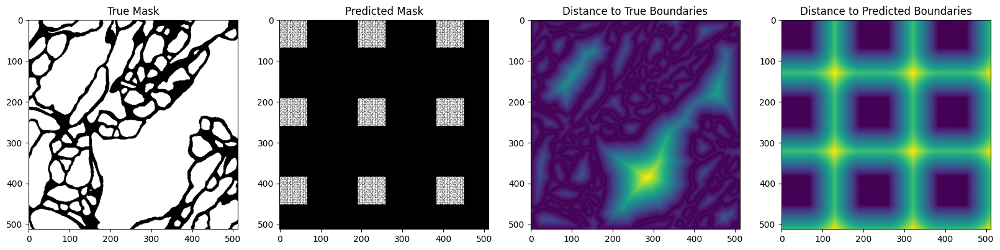

Mean Distance True to Pred: 30.9779
Mean Distance Pred to True: 10.9822
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 77.1622
Image 1: Warping Error = 20.9800

--- Image 2 ---


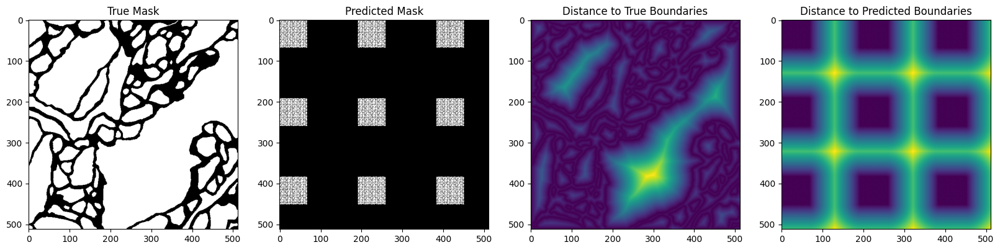

Mean Distance True to Pred: 31.5517
Mean Distance Pred to True: 11.6251
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 70.4557
Image 2: Warping Error = 21.5884

--- Image 3 ---


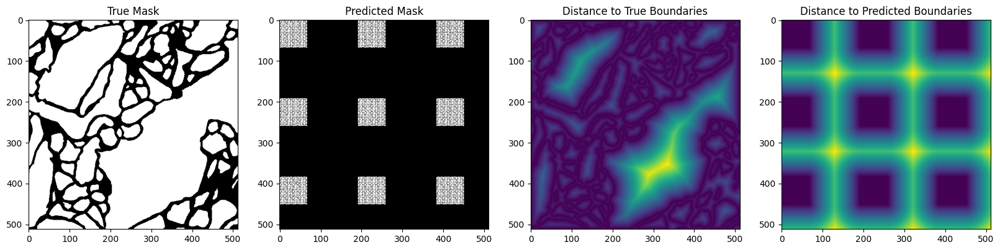

Mean Distance True to Pred: 32.3375
Mean Distance Pred to True: 11.3930
Max Distance True to Pred: 86.2786
Max Distance Pred to True: 59.0339
Image 3: Warping Error = 21.8652

--- Image 4 ---


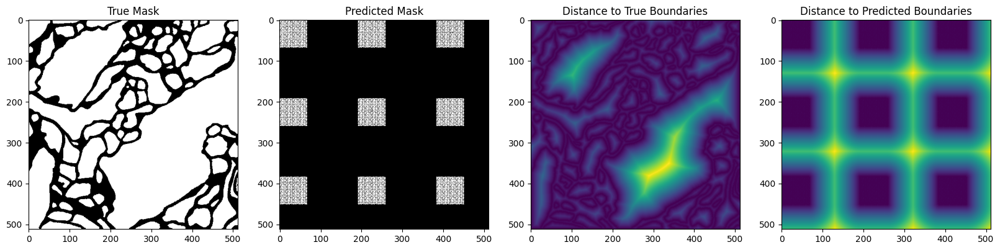

Mean Distance True to Pred: 31.8470
Mean Distance Pred to True: 11.1367
Max Distance True to Pred: 86.9770
Max Distance Pred to True: 60.0333
Image 4: Warping Error = 21.4918

--- Image 5 ---


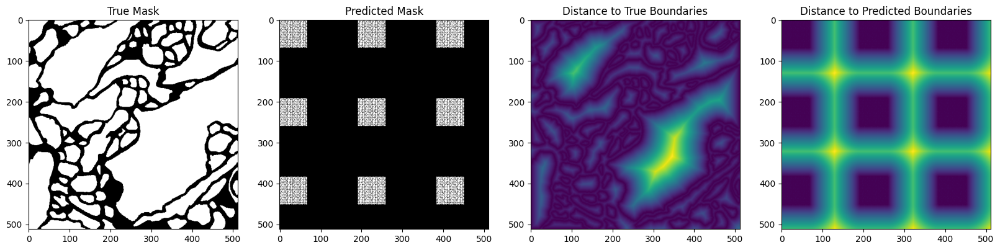

Mean Distance True to Pred: 31.1594
Mean Distance Pred to True: 9.3344
Max Distance True to Pred: 86.2670
Max Distance Pred to True: 54.3415
Image 5: Warping Error = 20.2469

--- Image 6 ---


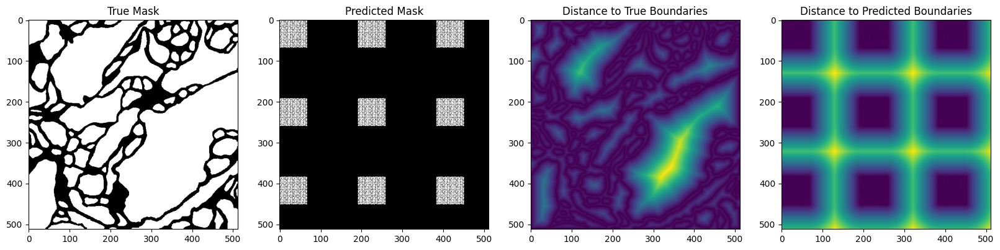

Mean Distance True to Pred: 32.0161
Mean Distance Pred to True: 10.4111
Max Distance True to Pred: 86.2670
Max Distance Pred to True: 58.6941
Image 6: Warping Error = 21.2136

--- Image 7 ---


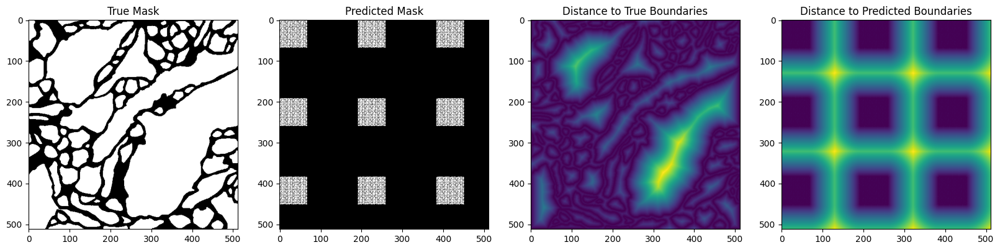

Mean Distance True to Pred: 31.3575
Mean Distance Pred to True: 9.3856
Max Distance True to Pred: 86.9770
Max Distance Pred to True: 54.2033
Image 7: Warping Error = 20.3716

--- Image 8 ---


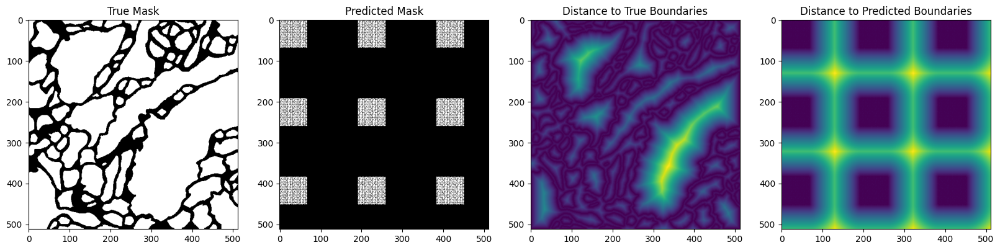

Mean Distance True to Pred: 31.0518
Mean Distance Pred to True: 9.3511
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 56.8595
Image 8: Warping Error = 20.2014

--- Image 9 ---


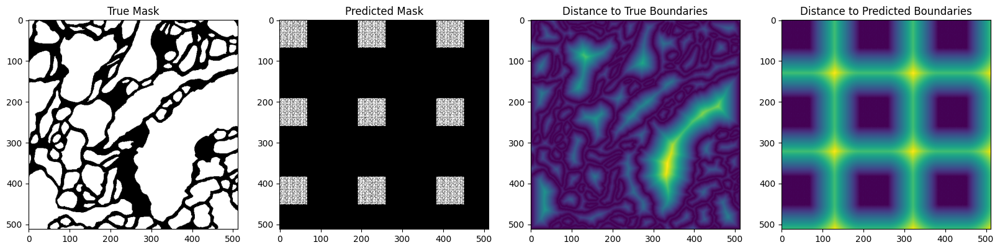

Mean Distance True to Pred: 31.9577
Mean Distance Pred to True: 9.7404
Max Distance True to Pred: 86.9770
Max Distance Pred to True: 53.4135
Image 9: Warping Error = 20.8490

--- Image 10 ---


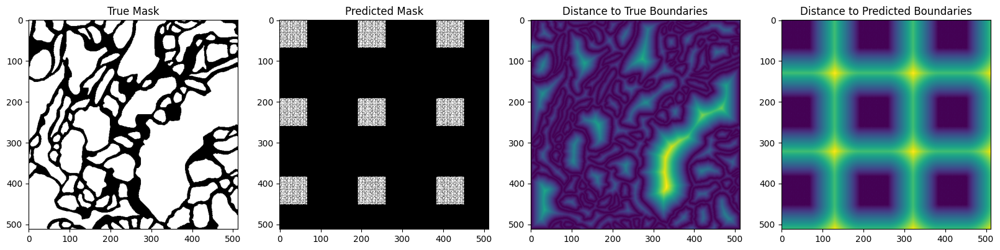

Mean Distance True to Pred: 32.2553
Mean Distance Pred to True: 8.0603
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 46.3897
Image 10: Warping Error = 20.1578

--- Image 11 ---


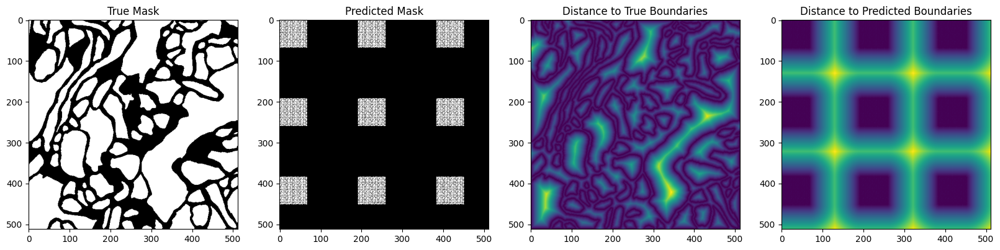

Mean Distance True to Pred: 32.0166
Mean Distance Pred to True: 7.7222
Max Distance True to Pred: 86.2670
Max Distance Pred to True: 39.5601
Image 11: Warping Error = 19.8694

--- Image 12 ---


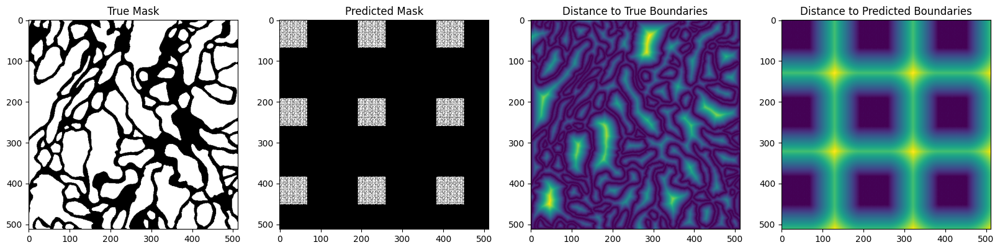

Mean Distance True to Pred: 33.6037
Mean Distance Pred to True: 7.2581
Max Distance True to Pred: 86.9770
Max Distance Pred to True: 36.7696
Image 12: Warping Error = 20.4309

--- Image 13 ---


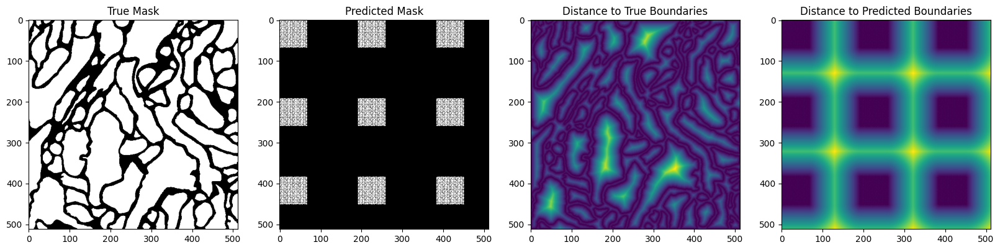

Mean Distance True to Pred: 32.9557
Mean Distance Pred to True: 7.3874
Max Distance True to Pred: 86.9770
Max Distance Pred to True: 35.4401
Image 13: Warping Error = 20.1716

--- Image 14 ---


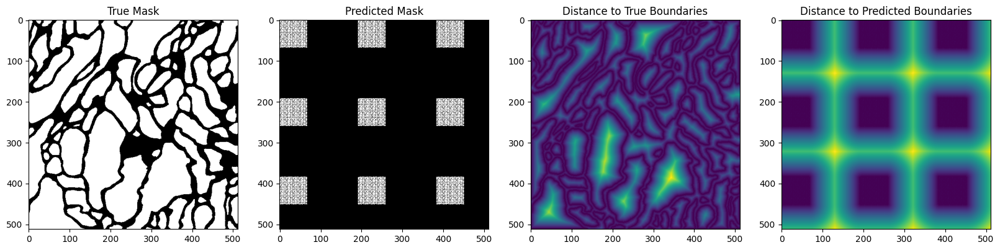

Mean Distance True to Pred: 33.0214
Mean Distance Pred to True: 7.3641
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 37.4433
Image 14: Warping Error = 20.1928

--- Image 15 ---


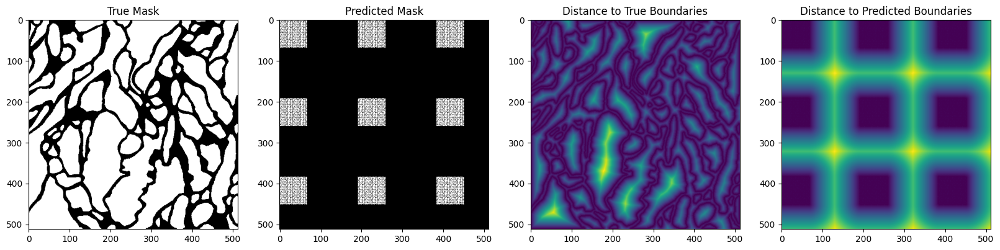

Mean Distance True to Pred: 32.4190
Mean Distance Pred to True: 6.3174
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 35.1710
Image 15: Warping Error = 19.3682

--- Image 16 ---


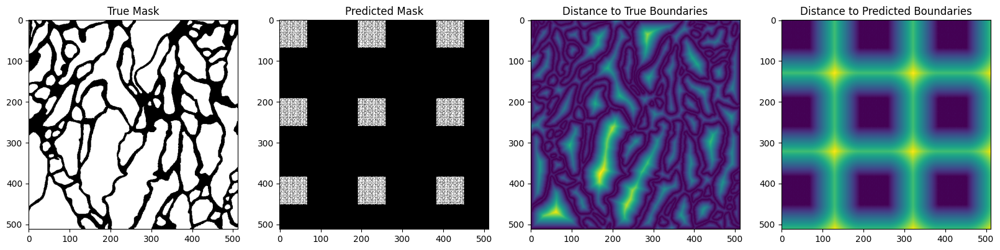

Mean Distance True to Pred: 32.4054
Mean Distance Pred to True: 6.1988
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 37.0135
Image 16: Warping Error = 19.3021

--- Image 17 ---


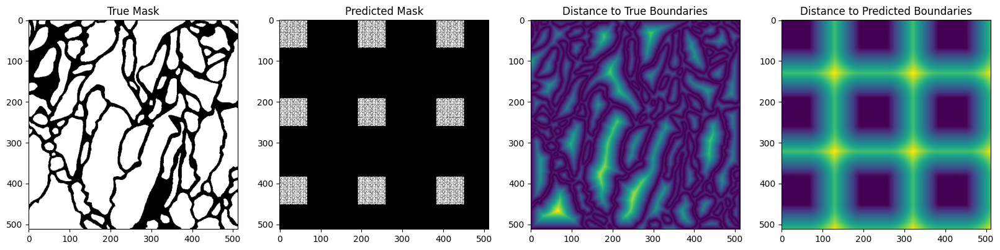

Mean Distance True to Pred: 31.9125
Mean Distance Pred to True: 6.2366
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 38.3275
Image 17: Warping Error = 19.0745

--- Image 18 ---


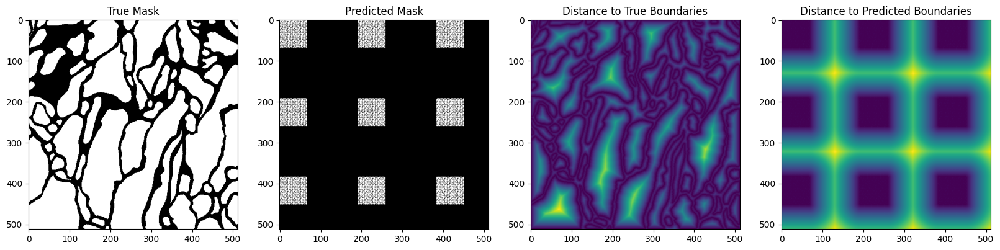

Mean Distance True to Pred: 32.5972
Mean Distance Pred to True: 6.4588
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 40.2492
Image 18: Warping Error = 19.5280

--- Image 19 ---


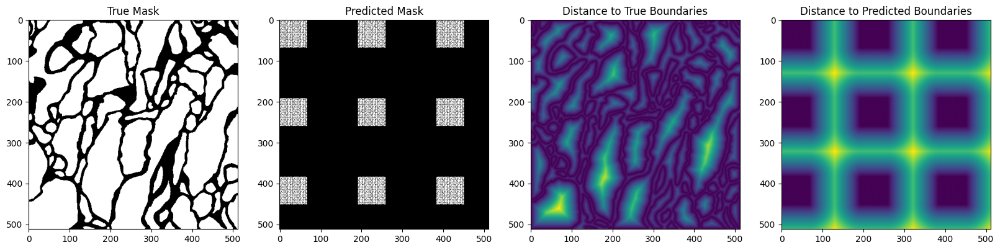

Mean Distance True to Pred: 32.5798
Mean Distance Pred to True: 6.3859
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 43.0116
Image 19: Warping Error = 19.4829

--- Image 20 ---


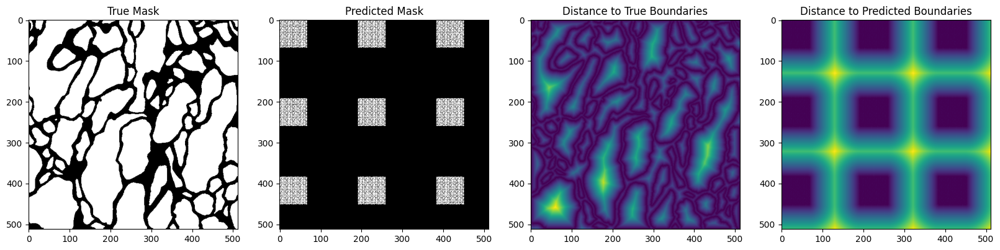

Mean Distance True to Pred: 31.4364
Mean Distance Pred to True: 6.8158
Max Distance True to Pred: 86.2786
Max Distance Pred to True: 49.6488
Image 20: Warping Error = 19.1261

--- Image 21 ---


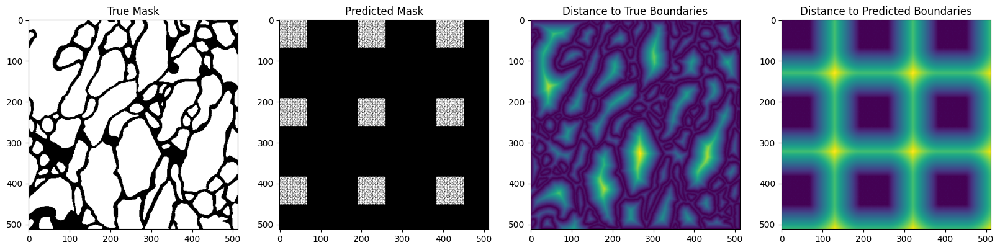

Mean Distance True to Pred: 31.5335
Mean Distance Pred to True: 7.1885
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 35.0571
Image 21: Warping Error = 19.3610

--- Image 22 ---


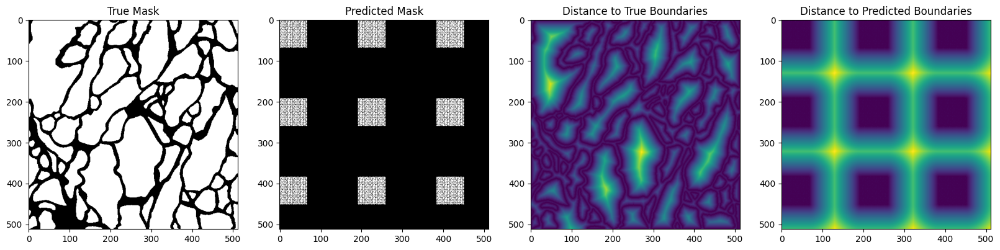

Mean Distance True to Pred: 32.4118
Mean Distance Pred to True: 7.7781
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 40.0000
Image 22: Warping Error = 20.0949

--- Image 23 ---


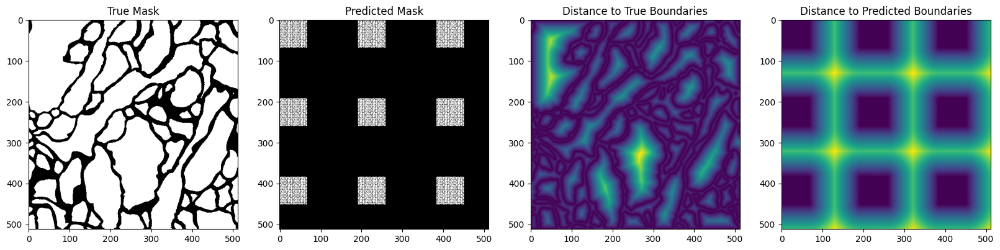

Mean Distance True to Pred: 31.6544
Mean Distance Pred to True: 8.0294
Max Distance True to Pred: 86.2670
Max Distance Pred to True: 48.3839
Image 23: Warping Error = 19.8419

--- Image 24 ---


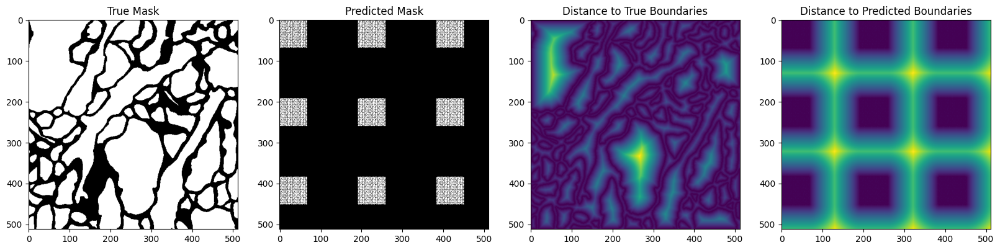

Mean Distance True to Pred: 30.7766
Mean Distance Pred to True: 7.0053
Max Distance True to Pred: 88.3912
Max Distance Pred to True: 47.0106
Image 24: Warping Error = 18.8910

--- Image 25 ---


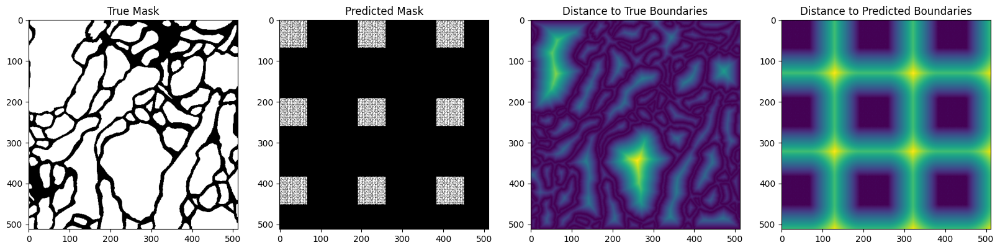

Mean Distance True to Pred: 30.7590
Mean Distance Pred to True: 7.7266
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 51.9230
Image 25: Warping Error = 19.2428

--- Image 26 ---


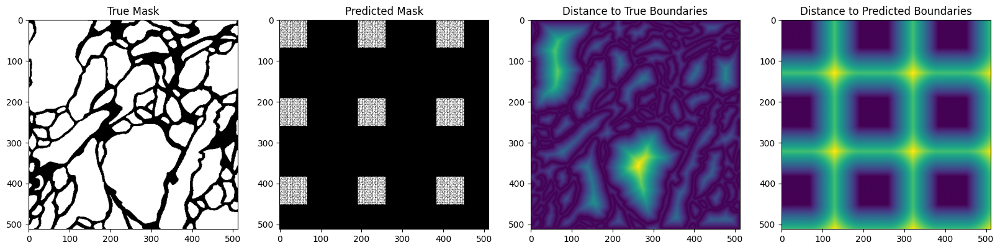

Mean Distance True to Pred: 30.3401
Mean Distance Pred to True: 7.4221
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 56.4004
Image 26: Warping Error = 18.8811

--- Image 27 ---


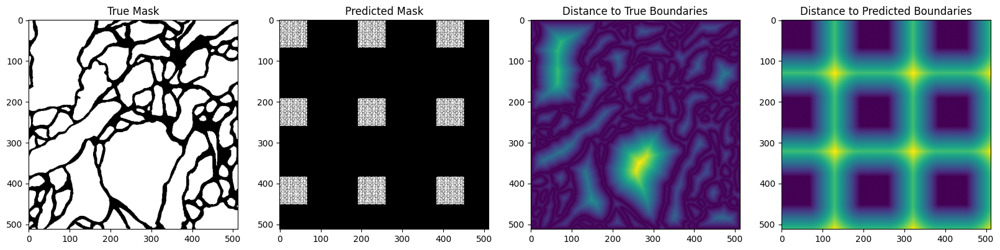

Mean Distance True to Pred: 30.6256
Mean Distance Pred to True: 7.7403
Max Distance True to Pred: 86.9770
Max Distance Pred to True: 68.5055
Image 27: Warping Error = 19.1829

--- Image 28 ---


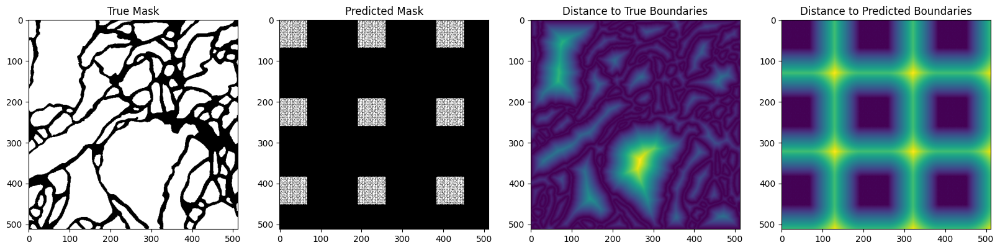

Mean Distance True to Pred: 29.8519
Mean Distance Pred to True: 7.1777
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 63.6396
Image 28: Warping Error = 18.5148

--- Image 29 ---


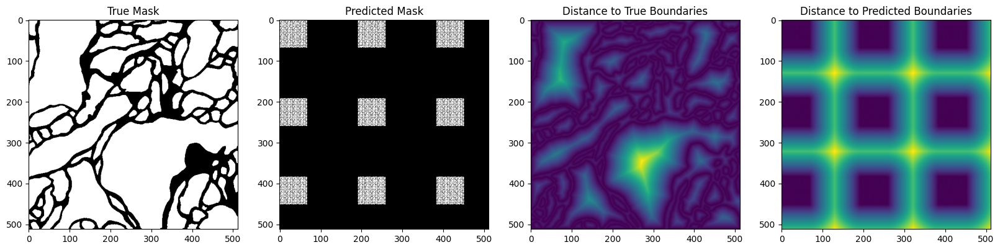

Mean Distance True to Pred: 30.2261
Mean Distance Pred to True: 8.2831
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 58.8218
Image 29: Warping Error = 19.2546

--- Image 30 ---


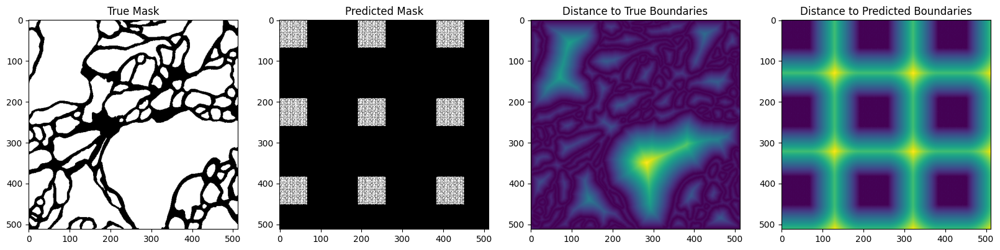

Mean Distance True to Pred: 30.4818
Mean Distance Pred to True: 8.1505
Max Distance True to Pred: 87.6812
Max Distance Pred to True: 55.8659
Image 30: Warping Error = 19.3161


In [58]:
test_model_with_diagnostics(model, test_volume, test_labels, tile_size=256, overlap=64, device=device)
